In [1]:
# relevant imports
from datetime import datetime
import requests
import json
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import networkx as nx
import matplotlib.pyplot as plt
from fa2_modified import ForceAtlas2
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import numpy as np
import pandas as pd
from sentence_transformers import SentenceTransformer
import community as community_louvain 
from nltk.probability import FreqDist
from collections import defaultdict
# nltk.download('punkt')
# nltk.download('stopwords')
# nltk.download('wordnet')
# nltk.dowlnoad('punkt_tab')


origin of speech data: https://data.millercenter.org/api.html

### Save and preprocess speeches data

In [2]:
endpoint = "https://api.millercenter.org/speeches"
r = requests.post(url = endpoint)
data = r.json()
items = data['Items']

while 'LastEvaluatedKey' in data:
  parameters = {"LastEvaluatedKey": data['LastEvaluatedKey']['doc_name']}
  r = requests.post(url = endpoint, params = parameters)
  data = r.json()
  items.extend(data.get('Items', []))

# Save the collected items to a JSON file
with open('speeches.json', 'w') as f:
  json.dump(items, f, indent=4)

print(f'Saved {len(items)} speeches to speeches.json')

Saved 1057 speeches to speeches.json


In [2]:
# load data from the JSON file
with open('speeches.json', 'r') as f:
  speeches = json.load(f)

In [3]:
# Convert the date strings to datetime objects
for speech in speeches:
    date_str = speech['date'][:10]
    speech['date'] = datetime.strptime(date_str, '%Y-%m-%d')

# Consider only speeches after 1790, as we only have gdp data from 1790-2024
speeches = [speech for speech in speeches if speech['date'].year >= 1790]


In [4]:
# print number of speeches, presidents, time span,...
print(f'Number of speeches: {len(speeches)}')
presidents = set(speech['president'] for speech in speeches)
print(f'Number of presidents: {len(presidents)}')
speeches.sort(key=lambda x: x['date'])
print(f'Time span: {speeches[0]["date"].year} - {speeches[-1]["date"].year}')


Number of speeches: 1055
Number of presidents: 45
Time span: 1790 - 2024


In [5]:
# get text embeddings
model = SentenceTransformer('all-MiniLM-L6-v2')
embeddings = model.encode([speech['transcript'] for speech in speeches])

c:\Users\Beatriz\anaconda3\Lib\site-packages\huggingface_hub\file_download.py:1150: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


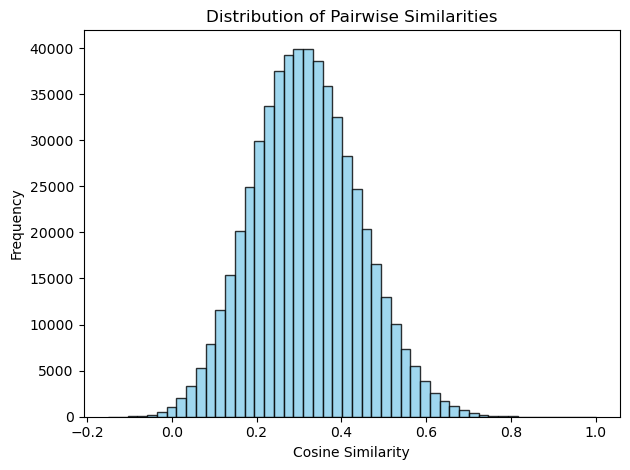

In [6]:
# Compute the cosine similarity matrix
similarity_matrix = cosine_similarity(embeddings)
# Get the upper triangle of the matrix without the diagonal (remove repeated pairs and self-similarity)
upper_triangle = similarity_matrix[np.triu_indices_from(similarity_matrix, k=1)]
# Plot bar chart
hist, bin_edges = np.histogram(upper_triangle.flatten(), bins=50)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Cosine Similarity')
plt.ylabel('Frequency')
plt.title('Distribution of Pairwise Similarities')
plt.tight_layout()
plt.show()

TODO: find "optimal" threshhold for cosine similarity

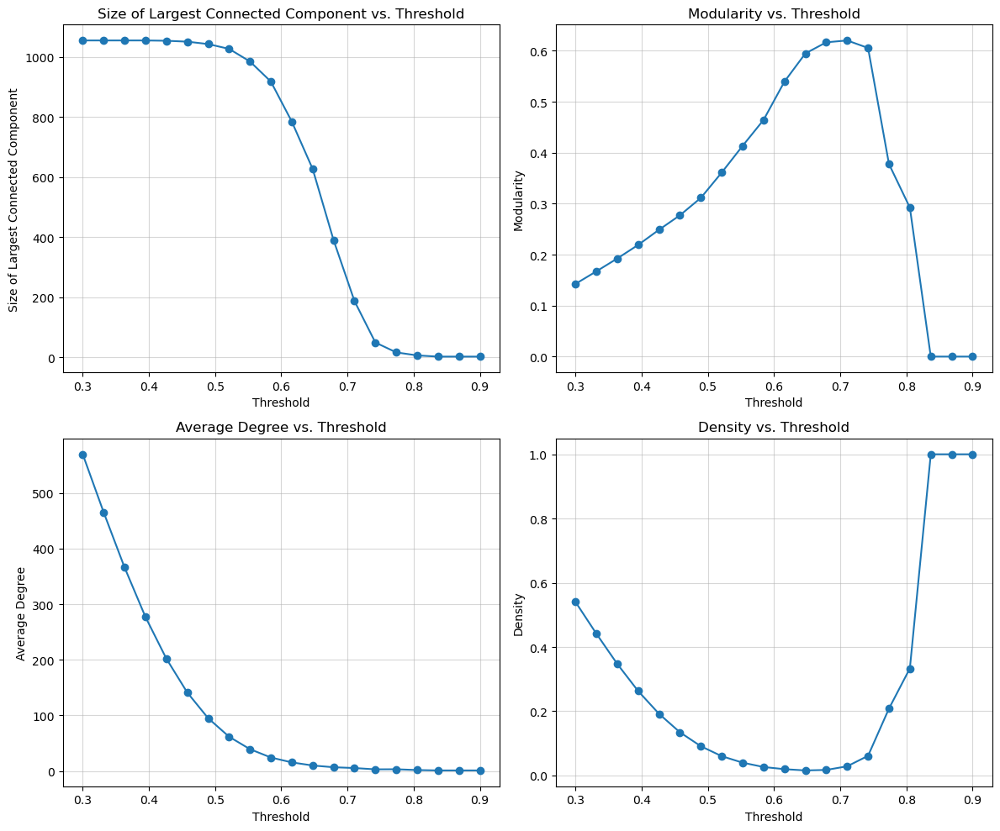

In [7]:
thresholds = np.linspace(0.3, 0.9, 20)
metrics = {'density': [], 'modularity': [], 'avg_degree': [], 'largest_cc_size': []}
i_indices, j_indices = np.triu_indices_from(similarity_matrix, k=1)
similarity_list = [(i, j, similarity_matrix[i, j]) for i, j in zip(i_indices, j_indices)]

for threshold in thresholds:
    # create graph
    G = nx.Graph()
    G.add_nodes_from(range(len(similarity_matrix)))
    # eges based on similarity
    for i in range(len(speeches)):
        for j in range(i + 1, len(speeches)):
            if similarity_matrix[i][j] > threshold:
                G.add_edge(i, j, weight=similarity_matrix[i][j])
    
    # calculate network metrics
    # largest connected component
    largest_component = max(nx.connected_components(G), key=len)
    largest_cc_size = len(largest_component)
    metrics['largest_cc_size'].append(largest_cc_size)
    largest_cc = G.subgraph(largest_component)
    # remove nodes with degree 0
    G = G.subgraph([node for node in G.nodes() if G.degree(node) > 0])
    # density
    metrics['density'].append(nx.density(largest_cc))
    # average degree
    avg_degree = np.mean([deg for _, deg in largest_cc.degree()])
    metrics['avg_degree'].append(avg_degree)
    # modularity
    modularity = community_louvain.modularity(community_louvain.best_partition(largest_cc), largest_cc)
    metrics['modularity'].append(modularity)

# visualize metrics in different plots
plt.subplots(2, 2, figsize=(12, 10))
plt.subplot(2, 2, 1)
plt.plot(thresholds, metrics['largest_cc_size'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Size of Largest Connected Component')
plt.title('Size of Largest Connected Component vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 2)
plt.plot(thresholds, metrics['modularity'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Modularity')
plt.title('Modularity vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 3)
plt.plot(thresholds, metrics['avg_degree'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Average Degree')
plt.title('Average Degree vs. Threshold')
plt.grid(alpha=0.5)
plt.subplot(2, 2, 4)
plt.plot(thresholds, metrics['density'], marker='o')
plt.xlabel('Threshold')
plt.ylabel('Density')
plt.title('Density vs. Threshold')
plt.grid(alpha=0.5)
plt.tight_layout()
plt.show()



anything else?? 0.625??

 0.6 to 0.65 is optimal, as modularity is high while the largest connected component is still large enough to preserve network interpretability.
 0.625 balances modularity and connectedness, which should result in distinct communities without losing too many nodes or edges.

### Create speeches graph

In [8]:
# Create a graph where nodes are speeches and edges are similarities
SpeechNet = nx.Graph()

# Add nodes with attributes (each node is a speech)
for i, speech in enumerate(speeches):
    SpeechNet.add_node(i, title=speech['title'], president=speech['president'], date=speech['date'], transcript=speech['transcript'])

# Add edges between speeches with similarity greater than 0.625
threshold = 0.625
for i in range(len(speeches)):
    for j in range(i + 1, len(speeches)):
        if similarity_matrix[i][j] > threshold:
            SpeechNet.add_edge(i, j, weight=similarity_matrix[i][j])

In [9]:
# consider largest connected component
largest_cc = max(nx.connected_components(SpeechNet), key=len)
SpeechNet = SpeechNet.subgraph(largest_cc)

In [10]:
# remove isolated nodes
SpeechNet = SpeechNet.subgraph([node for node in SpeechNet.nodes() if SpeechNet.degree(node) > 0])

In [11]:
# print node and edge counts
print(f'Numer of Nodes: {SpeechNet.number_of_nodes()}')
print(f'Number of Edges: {SpeechNet.number_of_edges()}')

Numer of Nodes: 743
Number of Edges: 5041


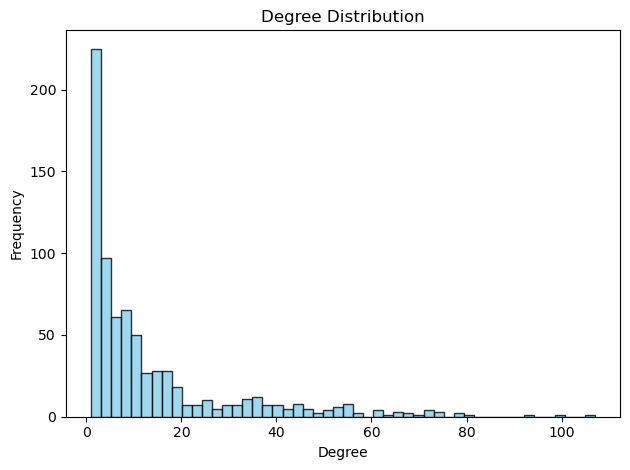

In [12]:
# plot degree distribution
degrees = [degree for node, degree in SpeechNet.degree()]
hist, bin_edges = np.histogram(degrees, bins=50)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)
plt.xlabel('Degree')
plt.ylabel('Frequency')
plt.title('Degree Distribution')
plt.tight_layout()
plt.show()


#### Communities analysis

In [13]:
# position nodes using Force Atlas 2
forceatlas2 = ForceAtlas2(verbose=False, scalingRatio=0.2)
positions = forceatlas2.forceatlas2_networkx_layout(SpeechNet, pos=None, iterations=2000)

In [14]:
from parties import president_party, party_colors
node_colors = []

# Add color to nodes based on party and party attribute to nodes
for node in SpeechNet.nodes():
    president = SpeechNet.nodes[node]['president']
    party = president_party.get(president, "None")  # Get party or default to "None"
    SpeechNet.nodes[node]['party'] = party
    color = party_colors.get(party, "gray")  # Get color based on party
    node_colors.append(color)

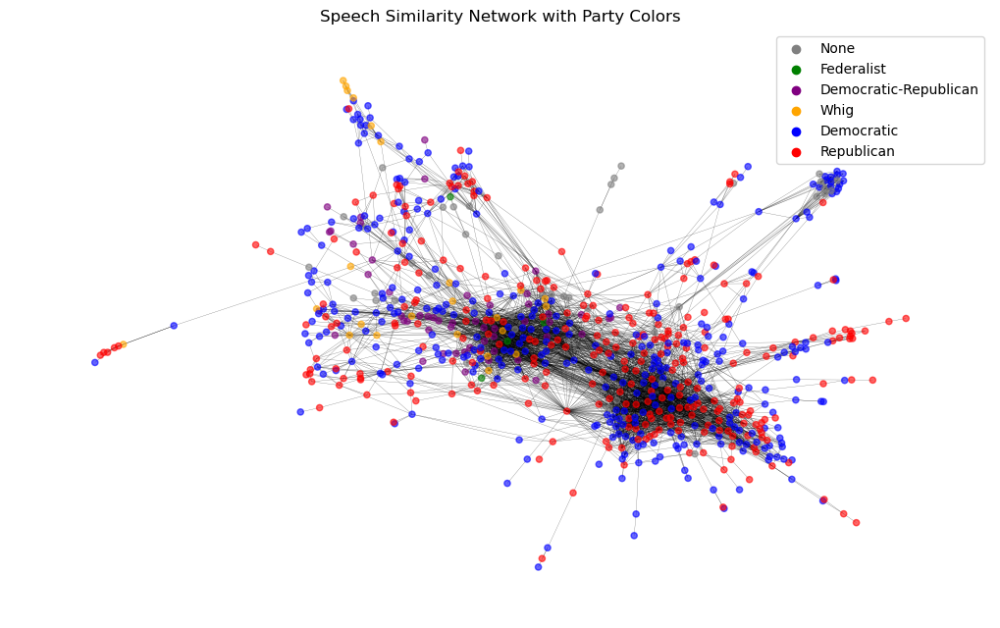

In [15]:
# plot the network 
plt.figure(figsize=(10,6))
nx.draw(SpeechNet, pos=positions, with_labels=False, node_size=20, alpha=0.6, node_color=node_colors, width=0.2)
for party, color in party_colors.items():
    plt.scatter([], [], c=color, label=party)
plt.legend(scatterpoints=1, loc='best')
plt.title('Speech Similarity Network with Party Colors')
plt.show()

In [138]:
# Create a dictionary to map parties to their respective nodes
parties_dict = {}
for node, data in SpeechNet.nodes(data=True):
    party = data.get('party')
    if party not in parties_dict:
        parties_dict[party] = []
    parties_dict[party].append(node)

# calculate modularity for parties communities
modularity = 0.0
L = SpeechNet.number_of_edges()  # Total number of edges in the graph
for genre, nodes in parties_dict.items():
    genre_subgraph = SpeechNet.subgraph(nodes)
    L_c = genre_subgraph.number_of_edges()  # Number of edges within the genre community
    K_c = sum(dict(SpeechNet.degree(nodes)).values())  # Sum of degrees of nodes within the genre community
    modularity += (L_c / L) - ((K_c / (2 * L)) ** 2)
print(f'Modularity considering parties: {modularity}')

Modularity considering parties: 0.07699803488010101


In [281]:
# calculate modularity for louvain communities
louvain_partition = community_louvain.best_partition(SpeechNet, random_state=41)
nx.set_node_attributes(SpeechNet, louvain_partition, 'louvain_community')
louvain_modularity = community_louvain.modularity(louvain_partition, SpeechNet)
print(f"Louvain modularity: {louvain_modularity}")


Louvain modularity: 0.5495970837354964


In [282]:
# create a dictionary to map louvain communities to their respective nodes
louvain_dict = defaultdict(list)
for node, community in louvain_partition.items():
    louvain_dict[community].append(node)

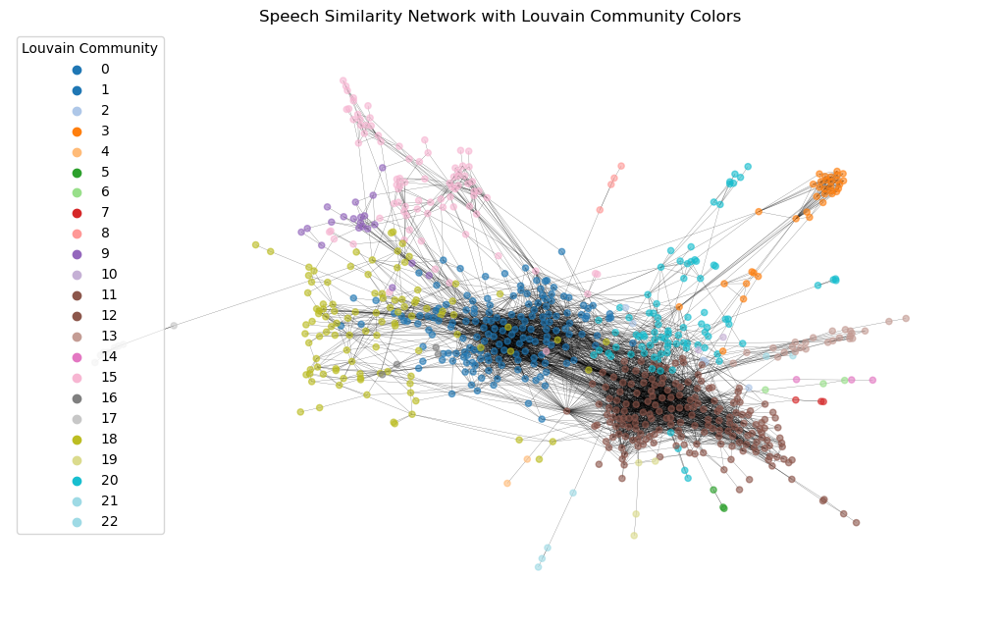

In [283]:
# get colors for louvain communities
louvain_colors = [louvain_partition[node] for node in SpeechNet.nodes()]
colors = plt.cm.get_cmap('tab20', len(set(louvain_dict.keys())))
louvain_colors = {community: colors(i) for i, community in enumerate(set(louvain_dict.keys()))}
# assign colors to nodes
node_colors = [louvain_colors[louvain_partition[node]] for node in SpeechNet.nodes()]
# plot the network
plt.figure(figsize=(10,6))
nx.draw(SpeechNet, pos=positions, with_labels=False, node_size=20, alpha=0.6, node_color=node_colors, width=0.2)
for community, color in louvain_colors.items():
    plt.scatter([], [], color=color, label=community)
plt.legend(scatterpoints=1, loc='best', title='Louvain Community')
plt.title('Speech Similarity Network with Louvain Community Colors')
plt.show()

TODO: 
- compare the two community detection methods (confusion matrix, etc.)
- plot number of speeches per community, number of times a president appears, date


## speech sentiment analysis

In [20]:
# download sentiment wordlist
with open('Data_Set_S1.txt', 'r') as f:
    data_S1 = f.read()

data_S1 = [line.split('\t') for line in data_S1.strip().split('\n')]
data_S1 = data_S1[3:]
data_S1 = pd.DataFrame(data_S1[1:], columns = data_S1[0])

In [21]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def process_text(text):
    """
    Process the text by tokenizing, removing punctuation, setting to lowercase, removing stopwords, and lemmatizing.
    """
    # tokenize text
    words = word_tokenize(text)
    # remove punctuation
    words = [word for word in words if word.isalpha()]
    # set to lowercase
    words = [word.lower() for word in words]
    # remove stopwords
    words = [word for word in words if word not in stop_words]
    # lemmatize words
    words = [lemmatizer.lemmatize(word) for word in words]
    return words   



In [22]:
def sentiment_score(text):
    """
    Calculate the sentiment score of the text based on the sentiment wordlist.
    """
    # process text to get words
    words = process_text(text)
    freq_dist = FreqDist(words)
    # calculate sentiment score
    score = sum(freq_dist[word] *float(data_S1[data_S1['word']==word]['happiness_average'].values[0]) 
                for word in freq_dist if word in data_S1['word'].values)

    total_frequency = sum(freq_dist[word] for word in freq_dist if word in data_S1['word'].values)
    if total_frequency > 0:  # to avoid division by zero
        return score / total_frequency
    else:
        return 0.0

In [ ]:
# sentiment for every node's transcript
sentiments = {}
for node, data in SpeechNet.nodes(data=True):
    speech = node
    transcript = data['transcript']
    sentiments[speech] = sentiment_score(transcript)

In [28]:
# save the sentiment scores to a file
with open('sentiments.txt', 'w') as f:
    for speech, sentiment in sentiments.items():
        f.write(f"{speech} | {sentiment}\n")

In [89]:
# read sentiment scores from file
sentiments = {}
with open('sentiments.txt', 'r') as f:
    for line in f:
        speech, sentiment = line.strip().split(' | ')
        speech = int(speech)
        sentiments[speech] = float(sentiment)

# assign sentiment scores to nodes
nx.set_node_attributes(SpeechNet, sentiments, 'sentiment')

In [90]:
# average sentiment
average_sentiment = sum(sentiments.values()) / len(sentiments)
print(f"Average sentiment of the speeches: {average_sentiment}")

# median sentiment
median_sentiment = np.median(list(sentiments.values()))
print(f"Median sentiment of the speeches: {median_sentiment}")

# variance of sentiment
variance_sentiment = np.var(list(sentiments.values()))
print(f"Variance of sentiment of the speeches: {variance_sentiment}")

# 25th percentile of sentiment
percentile_25 = np.percentile(list(sentiments.values()), 25)
print(f"25th percentile of sentiment of the speeches: {percentile_25}")

# 75th percentile of sentiment
percentile_75 = np.percentile(list(sentiments.values()), 75)
print(f"75th percentile of sentiment of the speeches: {percentile_75}")

Average sentiment of the speeches: 5.638436693821281
Median sentiment of the speeches: 5.6295686619718275
Variance of sentiment of the speeches: 0.019115696090402423
25th percentile of sentiment of the speeches: 5.55791905855339
75th percentile of sentiment of the speeches: 5.715860427716681


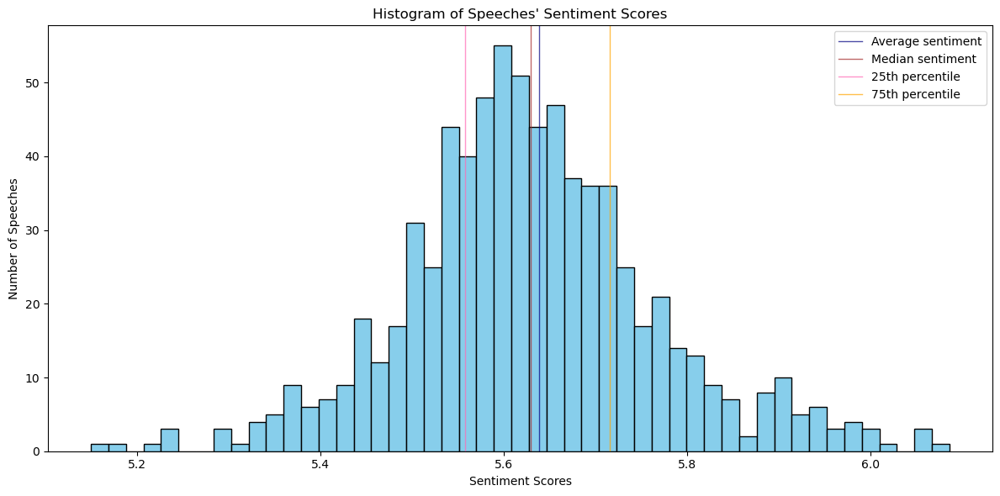

In [91]:
# plot of sentiment distribution of speeches

# Create bins for the sentiment scores
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)  

# Count the number of artists in each bin
binned_counts, bin_edges = np.histogram(list(sentiments.values()), bins=v)

# bar plot for the histogram
plt.figure(figsize=(12, 6))
plt.bar(bin_edges[:-1], binned_counts, width=np.diff(bin_edges), color='skyblue', edgecolor='black')
# average sentiment line
plt.axvline(average_sentiment, color='navy', linestyle='-', linewidth=1, alpha=0.7)
# median sentiment line
plt.axvline(median_sentiment, color='brown', linestyle='-', linewidth=1, alpha=0.7)
# 25th percentile line
plt.axvline(percentile_25, color='hotpink', linestyle='-', linewidth=1, alpha=0.7)
# 75th percentile line
plt.axvline(percentile_75, color='orange', linestyle='-', linewidth=1, alpha=0.7)
plt.legend(['Average sentiment', 'Median sentiment', '25th percentile', '75th percentile'])
plt.title('Histogram of Speeches\' Sentiment Scores')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Speeches')

plt.tight_layout()
plt.show()


In [92]:
# create tf lists for each speech's transcript
tf_speech = {}
for speech, data in SpeechNet.nodes(data=True):
    text = data['transcript']
    words = process_text(text)
    tf_speech[speech] = pd.Series(words).value_counts()

In [93]:
# Calculate document frequency for each word
doc_freq = defaultdict(int)
for tf in tf_speech.values():
    for word in tf.index:
        doc_freq[word] += 1

# Calculate IDF for each word
idf_speech = {word: np.log(len(tf_speech) / df) for word, df in doc_freq.items()}

In [94]:
# Calculate TF-IDF for each speech
tfidf_speech = {}
for speech, tf in tf_speech.items():
    tfidf_speech[speech] = {word: tf[word] * idf_speech[word] for word in tf.index}

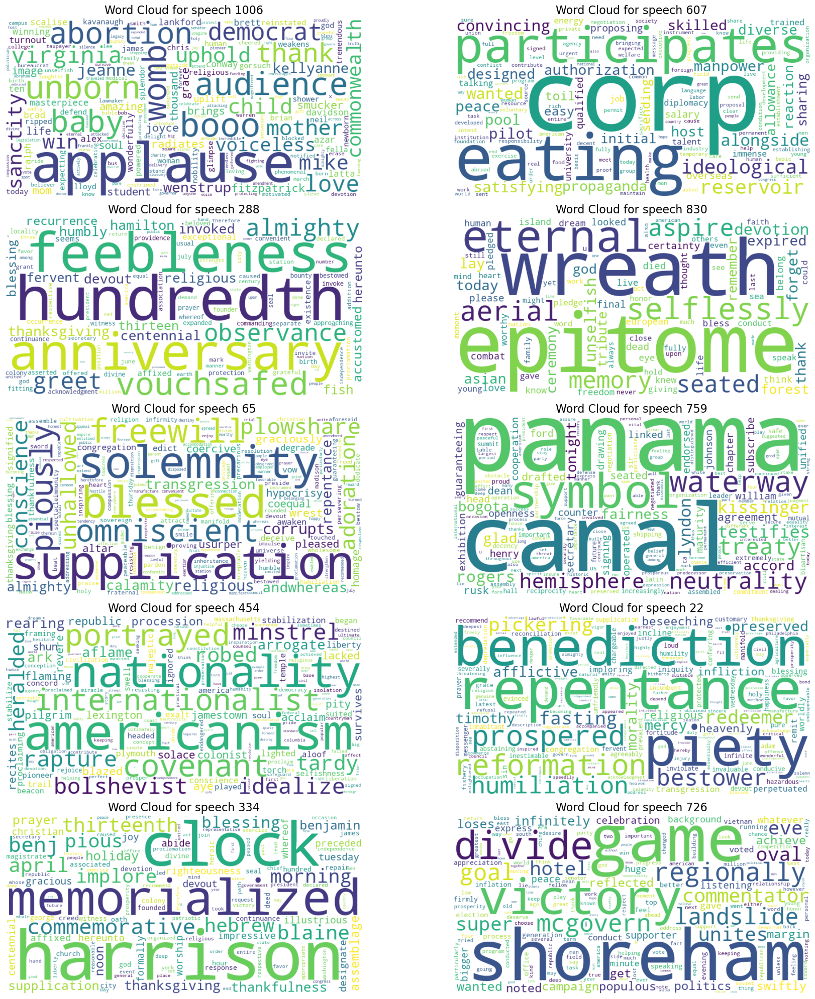

In [95]:
# Get the top 10 happiest speeches
happiest_speeches = sorted(sentiments, key=sentiments.get, reverse=True)[:10]

# Filter the tfidf_speech dictionary to include only the top 10 happiest speeches
top_tfidf_speeches = {speech: tfidf_speech[speech] for speech in happiest_speeches}

# Create word clouds for the top 10 happiest speeches
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
for i, (speech, tfidf) in enumerate(top_tfidf_speeches.items()):
    # Create word cloud
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for speech {speech}", fontsize=16)
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()

In [96]:
# print "legend" of 10 happiest speeches
for i, speech in enumerate(happiest_speeches):
    print(f"{i+1}. Speech {speech}")
    print(f"{SpeechNet.nodes[speech]['title']} by {SpeechNet.nodes[speech]['president']}.")

1. Speech 1006
January 24, 2020: Speech at March for Life by Donald Trump.
2. Speech 607
March 1, 1961: Establishment of the Peace Corps by John F. Kennedy.
3. Speech 288
June 26, 1876: Proclamation Celebrating the Hundredth Anniversary of Independence by Ulysses S. Grant.
4. Speech 830
November 11, 1988: Remarks at the Veteran's Day Ceremony by Ronald Reagan.
5. Speech 65
July 23, 1813: Proclamation on Day of Public Humiliation and Prayer by James Madison.
6. Speech 759
September 7, 1977: Statement on the Panama Canal Treaty Signing by Jimmy Carter.
7. Speech 454
January 20, 1920: Americanism by Warren G. Harding.
8. Speech 22
March 23, 1798: Proclamation of Day of Fasting, Humiliation and Prayer by John Adams.
9. Speech 334
April 4, 1889: Commemoration of the Centennial of Washington’s Inauguration by Benjamin Harrison.
10. Speech 726
November 7, 1972: Remarks on Being Reelected to the Presidency by Richard M. Nixon.


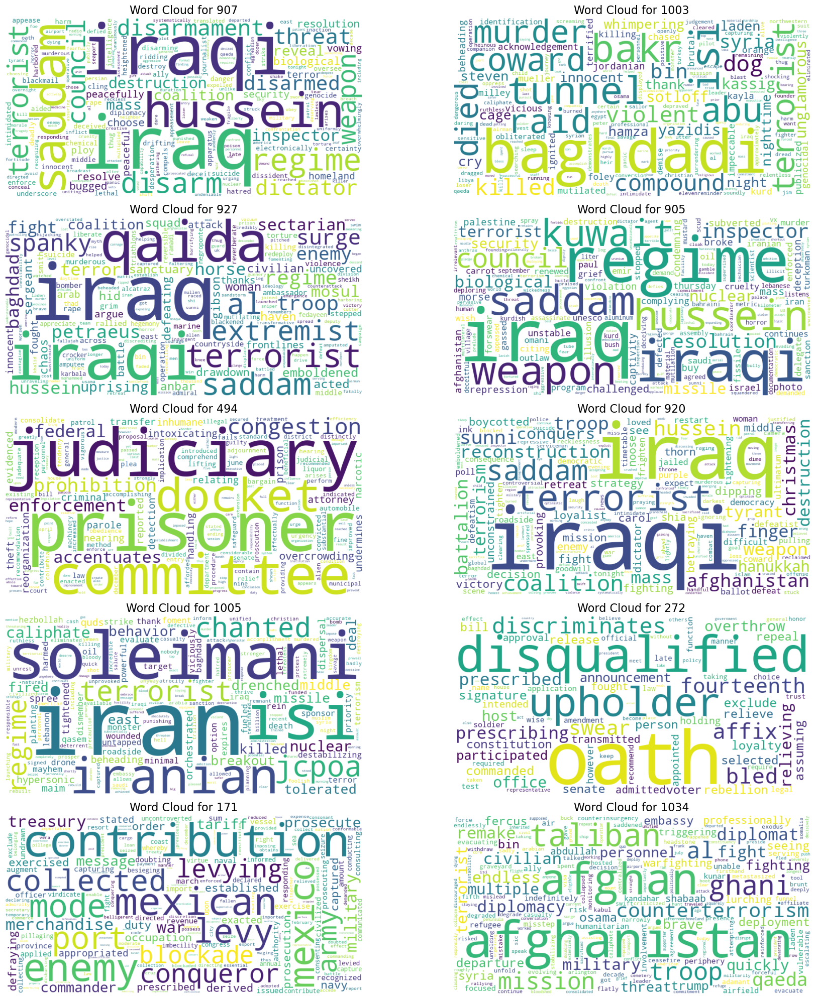

In [97]:
# Get the top 10 saddest speeches
saddest_speeches = sorted(sentiments, key=sentiments.get, reverse=False)[:10]

# Filter the tfidf_speech dictionary to include only the top 10 saddest speeches
top_tfidf_speeches = {speech: tfidf_speech[speech] for speech in saddest_speeches}

# Create word clouds for the top 10 saddest speeches
fig, axs = plt.subplots(5, 2, figsize=(20, 20))
for i, (speech, tfidf) in enumerate(top_tfidf_speeches.items()):
    # Create word cloud
    wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(tfidf)
    ax = plt.subplot(5, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"Word Cloud for {speech}", fontsize=16)

plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()

In [98]:
# print "legend" of 10 saddest speeches
for i, speech in enumerate(saddest_speeches):
    print(f"{i+1}. Speech {speech}")
    print(f"{SpeechNet.nodes[speech]['title']} by {SpeechNet.nodes[speech]['president']}.")

1. Speech 907
March 17, 2003: Address to the Nation on Iraq by George W. Bush.
2. Speech 1003
October 27, 2019: Statement on the the Death of Abu Bakr al-Baghdadi by Donald Trump.
3. Speech 927
March 19, 2008: Remarks on the War on Terror by George W. Bush.
4. Speech 905
September 12, 2002: Remarks at the UN General Assembly by George W. Bush.
5. Speech 494
April 28, 1930: Message Regarding Law Enforcement by Herbert Hoover.
6. Speech 920
December 19, 2005: Address on Renewal in Iraq by George W. Bush.
7. Speech 1005
January 8, 2020: Statement on Iran by Donald Trump.
8. Speech 272
February 15, 1871: Veto Message Regarding Restrictions on Rebellion Participants by Ulysses S. Grant.
9. Speech 171
January 2, 1849: Message Regarding War-time Measures by James K. Polk.
10. Speech 1034
August 16, 2021: Remarks on Situation in Afghanistan by Joe Biden.


acknowledge the use of the wordlist and the sentiment analysis method reflect only the surface sentiment of the words used, not the audience's emotional reaction.

TODO: make plot readable

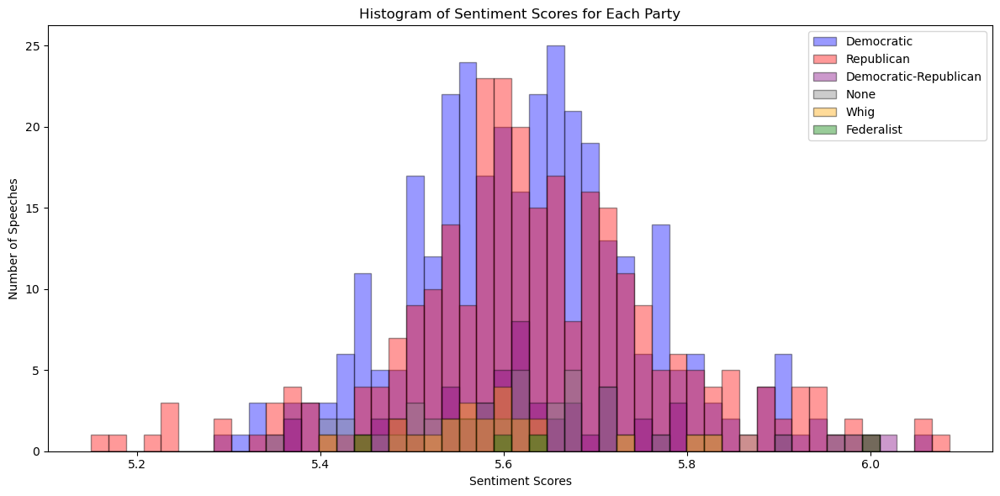

In [107]:
# plot distribution of sentiment scores for each party
party_sentiments = {party: [] for party in party_colors}
for node, data in SpeechNet.nodes(data=True):
    party = data.get('party')
    sentiment = data.get('sentiment')
    if party in party_colors:
        party_sentiments[party].append(sentiment)

# Create bins for the sentiment scores
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)

party_speech_counts = {party: len(party_sentiment) for party, party_sentiment in party_sentiments.items()}
sorted_parties = sorted(party_speech_counts, key=party_speech_counts.get, reverse=True)

# Plot the sentiment distribution for each party
plt.figure(figsize=(12, 6))
for i, party in enumerate(sorted_parties):
    party_sentiment = party_sentiments[party]
    binned_counts, bin_edges = np.histogram(party_sentiment, bins=v)
    plt.bar(bin_edges[:-1], binned_counts, width=np.diff(bin_edges), alpha=0.4, label=party, color=party_colors[party], edgecolor='black')
plt.legend()
plt.title('Histogram of Sentiment Scores for Each Party')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Speeches')
plt.tight_layout()
plt.show()


Opted to calculate the happiest and saddest parties based on the average sentiment of individual speeches rather than combining all speeches from each party. This approach prevents potential skewing of results by longer or more frequent speeches, ensuring that each speech contributes equally. By averaging sentiments, the analysis becomes more balanced and representative of each party’s overall sentiment, while still reflecting the diversity of perspectives within their speeches.

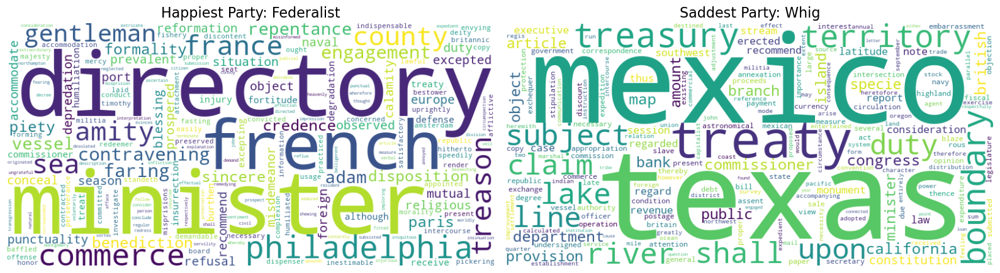

In [108]:
# get happiest and saddest parties on average 
avg_party_sentiments = {party: np.mean(sentiments) for party, sentiments in party_sentiments.items()}
happiest_party = max(avg_party_sentiments, key=avg_party_sentiments.get)
saddest_party = min(avg_party_sentiments, key=avg_party_sentiments.get)

# combine TF-IDF for the happiest party
happiest_party_tfidf = {}
for speech in parties_dict[happiest_party]:
    for word, score in tfidf_speech[speech].items():
        happiest_party_tfidf[word] = happiest_party_tfidf.get(word, 0.0) + score

# combine TF-IDF for the saddest party
saddest_party_tfidf = {}
for speech in parties_dict[saddest_party]:
    for word, score in tfidf_speech[speech].items():
        saddest_party_tfidf[word] = saddest_party_tfidf.get(word, 0.0) + score

# plot word clouds
happiest_party_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(happiest_party_tfidf)
saddest_party_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(saddest_party_tfidf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(happiest_party_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Happiest Party: {happiest_party}", fontsize=16)
plt.subplot(1, 2, 2)
plt.imshow(saddest_party_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Saddest Party: {saddest_party}", fontsize=16)
plt.tight_layout()
plt.show()


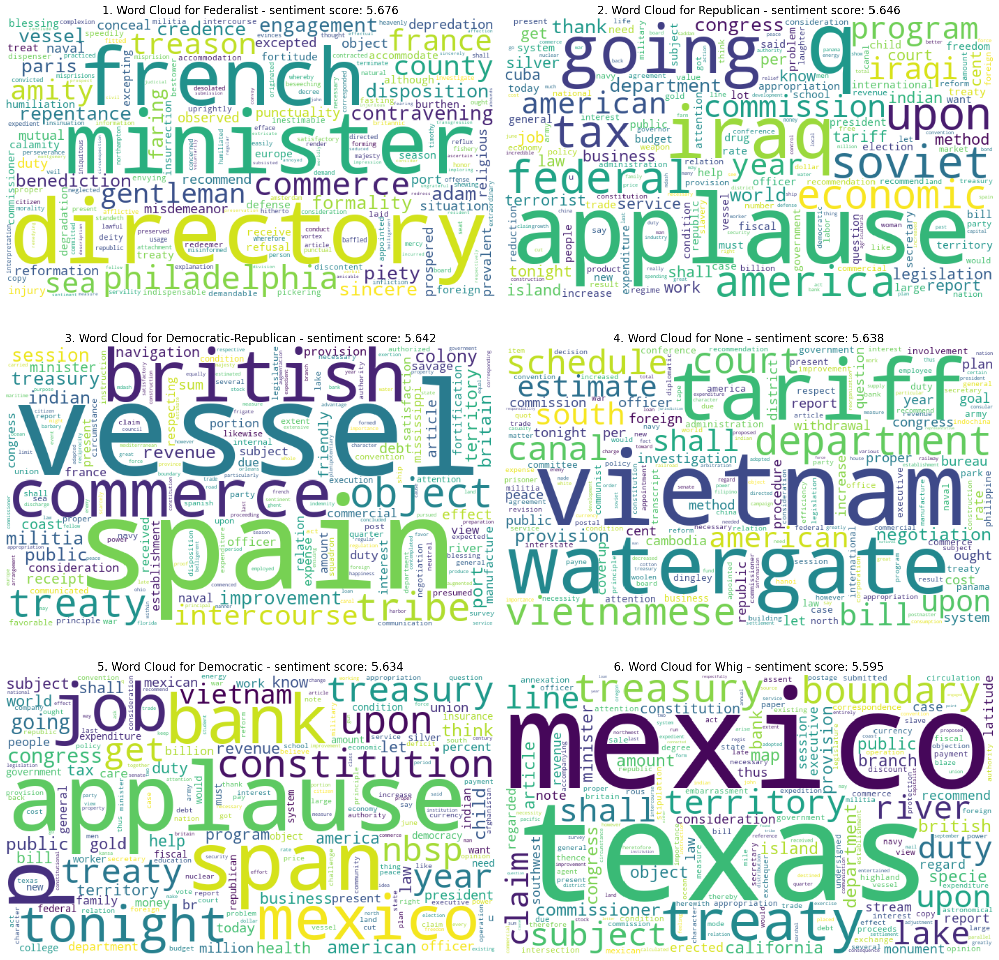

In [109]:
# order parties by average sentiment
avg_party_sentiments = {party: np.mean(sentiments) for party, sentiments in party_sentiments.items()}
sorted_parties = sorted(avg_party_sentiments, key=avg_party_sentiments.get, reverse=True)
# word clouds for the parties ordered
fig, axs = plt.subplots(3, 2, figsize=(20, 20))

for i, party in enumerate(sorted_parties):
    party_tfidf = {}
    for speech in parties_dict[party]:
        for word, score in tfidf_speech[speech].items():
            party_tfidf[word] = party_tfidf.get(word, 0.0) + score
    wordcloud = WordCloud(width=700, height=400, collocations=False, background_color='white').generate_from_frequencies(party_tfidf)
    ax = plt.subplot(3, 2, i + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    plt.title(f"{i+1}. Word Cloud for {party} - sentiment score: {avg_party_sentiments[party]:.3f}", fontsize=16)

plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, hspace=0.3, wspace=0.3)
plt.tight_layout()
plt.show()



all parties or only happiest and saddest?

TODO: make plot readable

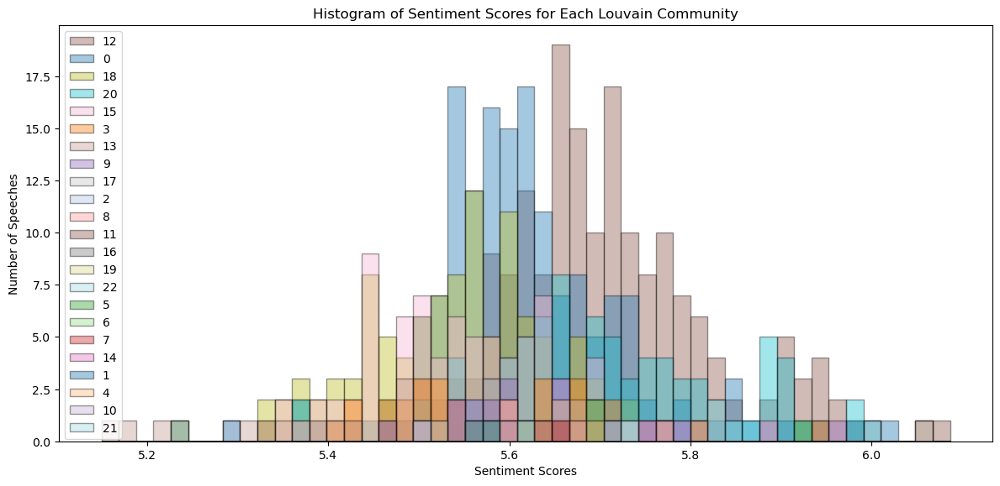

In [284]:
# plot distribution of sentiment scores for each community
community_sentiments = {community: [] for community in louvain_colors}
for node, data in SpeechNet.nodes(data=True):
    community = data.get('louvain_community')
    sentiment = data.get('sentiment')
    if community in louvain_colors:
        community_sentiments[community].append(sentiment)

community_speech_counts = {community: len(community_sentiment) for community, community_sentiment in community_sentiments.items()}
sorted_communities = sorted(community_speech_counts, key=community_speech_counts.get, reverse=True)
min_sentiment = min(sentiments.values())
max_sentiment = max(sentiments.values())
v = np.arange(min_sentiment, max_sentiment + variance_sentiment, variance_sentiment)

# Plot the sentiment distribution for each party
plt.figure(figsize=(12, 6))
for i, community in enumerate(sorted_communities):
    community_sentiment = community_sentiments[community]
    binned_counts, bin_edges = np.histogram(community_sentiment, bins=v)
    plt.bar(bin_edges[:-1], binned_counts, width=np.diff(bin_edges), alpha=0.4, label=community, color=louvain_colors[community], edgecolor='black')
plt.legend()
plt.title('Histogram of Sentiment Scores for Each Louvain Community')
plt.xlabel('Sentiment Scores')
plt.ylabel('Number of Speeches')
plt.tight_layout()
plt.show()


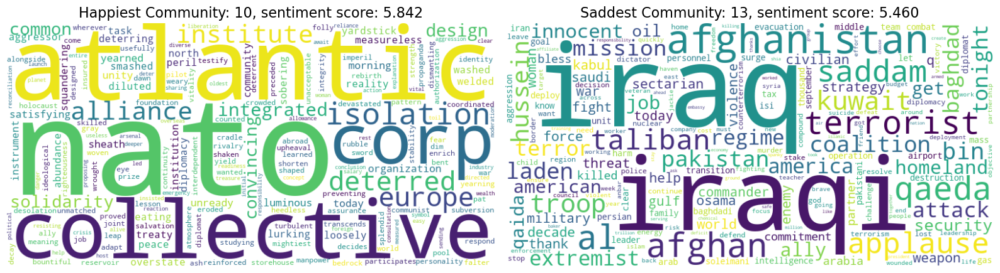

In [285]:
# get happiest and saddest communities on average based on community sentiments dictionary
avg_community_sentiments = {community: np.mean(sentiment) for community, sentiment in community_sentiments.items()}
happiest_community = max(avg_community_sentiments, key=avg_community_sentiments.get)
saddest_community = min(avg_community_sentiments, key=avg_community_sentiments.get)

# combine TF-IDF for the happiest community
happiest_community_tfidf = {}
for speech in louvain_dict[happiest_community]:
    for word, score in tfidf_speech[speech].items():
        happiest_community_tfidf[word] = happiest_community_tfidf.get(word, 0.0) + score

# combine TF-IDF for the saddest community
saddest_community_tfidf = {}
for speech in louvain_dict[saddest_community]:
    for word, score in tfidf_speech[speech].items():
        saddest_community_tfidf[word] = saddest_community_tfidf.get(word, 0.0) + score

# plot word clouds
happiest_community_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(happiest_community_tfidf)
saddest_community_wordcloud = WordCloud(width=800, height=400, collocations=False, background_color='white').generate_from_frequencies(saddest_community_tfidf)

plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(happiest_community_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Happiest Community: {happiest_community}, sentiment score: {avg_community_sentiments[happiest_community]:.3f}", fontsize=16)
plt.subplot(1, 2, 2)
plt.imshow(saddest_community_wordcloud, interpolation="bilinear")
plt.axis('off')
plt.title(f"Saddest Community: {saddest_community}, sentiment score: {avg_community_sentiments[saddest_community]:.3f}", fontsize=16)
plt.tight_layout()
plt.show()


## GDP data

origin of gdp data: https://www.measuringworth.com/datasets/

In [286]:
# add gdps to the speeches
gdp_data = pd.read_csv('USGDP_1790-2024.csv', skiprows=2)
# change name of 2nd column 
gdp_data.columns.values[1] = 'Real GDP per capita (dollars)'
gdp_data['Real GDP per capita (dollars)'] = gdp_data['Real GDP per capita (dollars)'].str.replace(',', '').astype(float)

# map years to GDP values
year_to_gdp = dict(zip(gdp_data['Year'], gdp_data['Real GDP per capita (dollars)']))
# map nodes to their GDP values
node_to_gdp = {}
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    node_to_gdp[node] = year_to_gdp.get(year, None)
# set the GDP attribute for the nodes
nx.set_node_attributes(SpeechNet, node_to_gdp, 'gdp')

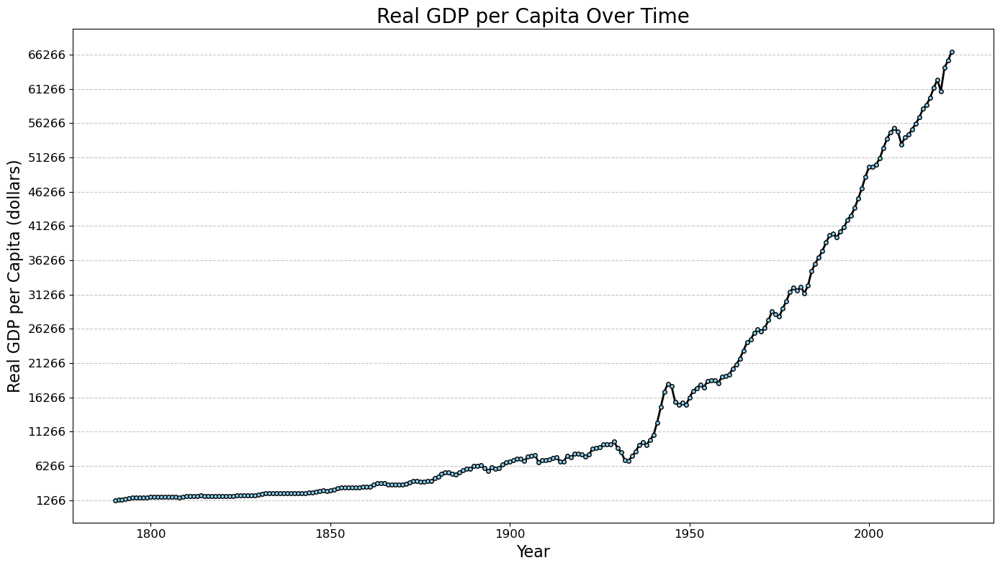

In [287]:
# plot the GDP over time
years = gdp_data['Year']
gdps = gdp_data['Real GDP per capita (dollars)']
plt.figure(figsize=(14, 8))
plt.plot(years, gdps, color='black', marker='o', linestyle='-', linewidth=2, markersize=4, markerfacecolor='skyblue', markeredgecolor='black')
plt.title('Real GDP per Capita Over Time', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Real GDP per Capita (dollars)', fontsize=16)
plt.xticks(fontsize=12)
y_ticks = range(int(min(gdps)), int(max(gdps)) + 1, 5000)
plt.yticks(y_ticks, fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

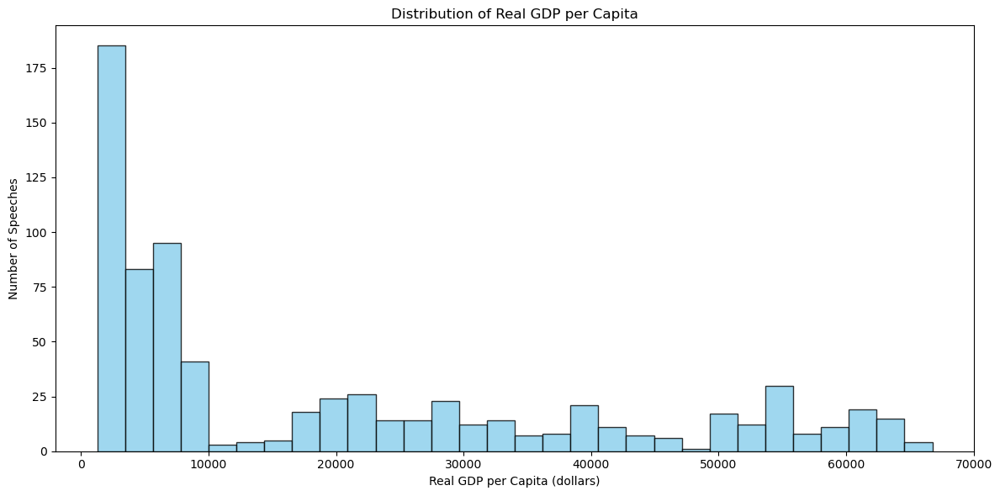

In [288]:
# bar plot of gdps distribution over speeches with plt.bar
plt.figure(figsize=(12, 6))
gdps = [data['gdp'] for _, data in SpeechNet.nodes(data=True) if data['gdp'] is not None]
hist, bin_edges = np.histogram(gdps, bins=30)
bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])
plt.bar(bin_centers, hist, width=bin_edges[1] - bin_edges[0], color='skyblue', edgecolor='black', alpha=0.8)    
plt.title('Distribution of Real GDP per Capita')
plt.xlabel('Real GDP per Capita (dollars)')
plt.ylabel('Number of Speeches')
plt.tight_layout()
plt.show()

### GDP growth per presidential term

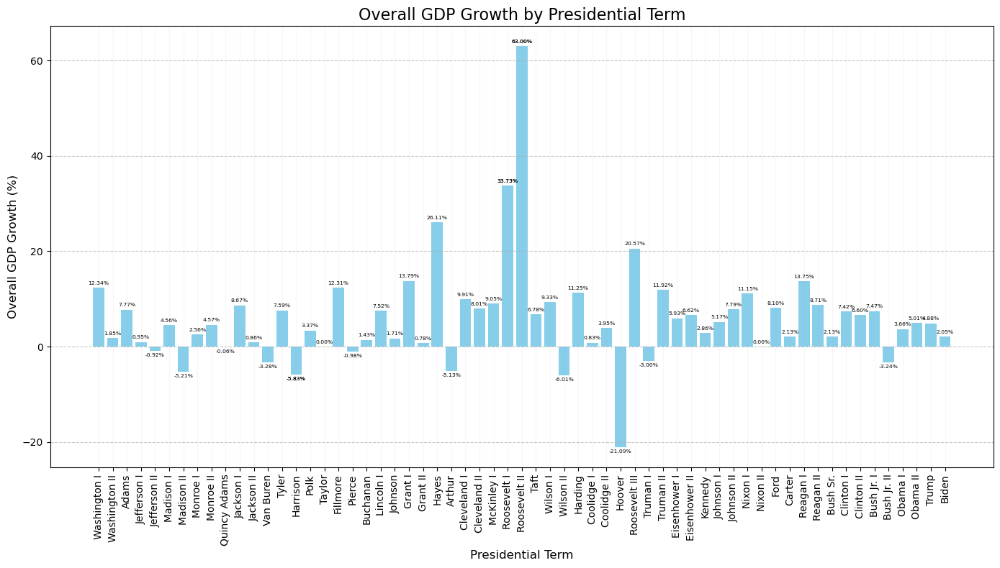

In [289]:
# get presidential terms
terms_df = pd.read_csv('presidential_terms.csv', sep=',')

# get term based on year
def get_term(year):
    for _, row in terms_df.iterrows():
        if row['Start Year'] <= year <= row['End Year']:
            return row['Term']
    return None

# Assign presidential terms to GDP data
gdp_data['Term'] = gdp_data['Year'].apply(get_term)

# Calculate overall GDP growth rate for each presidential term
gdp_growth = gdp_data.groupby('Term', as_index=False).agg({
    'Real GDP per capita (dollars)': lambda x: (x.iloc[-1] - x.iloc[0]) / x.iloc[0] * 100
})

# merge with the presidential terms 
gdp_growth = gdp_growth.merge(terms_df[['Term', 'Start Year']], on='Term', how='left')

# Sort by the start year of the presidential term
gdp_growth = gdp_growth.sort_values(by='Start Year')

# Plot overall GDP growth by presidential term
plt.figure(figsize=(14, 8))
bars = plt.bar(gdp_growth['Term'], gdp_growth['Real GDP per capita (dollars)'], color='skyblue')
plt.xticks(rotation=90, fontsize=10)
plt.title('Overall GDP Growth by Presidential Term', fontsize=16)
plt.xlabel('Presidential Term', fontsize=12)
plt.ylabel('Overall GDP Growth (%)', fontsize=12)
for bar in bars:
    height = bar.get_height() 
    # If the bar is positive, place text above, else place it below
    if height >= 0:
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.5,  # Place text above positive bars
                 f'{height:.2f}%', ha='center', va='bottom', fontsize=5.5)
    else:
        plt.text(bar.get_x() + bar.get_width() / 2, height - 0.5,  # Place text below negative bars
                 f'{height:.2f}%', ha='center', va='top', fontsize=5.5)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.grid(axis='x', linestyle='-', alpha=0.1)
plt.tight_layout()
plt.show()



In [290]:
# sentiment over years
sentiment_over_years = defaultdict(list)
for node, data in SpeechNet.nodes(data=True):
    year = data['date'].year
    sentiment = data.get('sentiment')
    if sentiment is not None:
        sentiment_over_years[year].append(sentiment)

# Calculate the average sentiment for each year
average_sentiment_over_years = {year: np.mean(sentiments) for year, sentiments in sentiment_over_years.items()}

In [291]:
# correlation between average yearly sentiment and GDP

# drop from gdp_data the years that are not in average_sentiment_over_years
gdp_data_forcorr = gdp_data[gdp_data['Year'].isin(average_sentiment_over_years.keys())]
# drop from average_sentiment_over_years the years that are not in gdp_data
average_sentiment_over_years_forcorr = {year: sentiment for year, sentiment in average_sentiment_over_years.items() if year in gdp_data_forcorr['Year'].values}

df = pd.DataFrame({'Sentiment': average_sentiment_over_years_forcorr.values(), 'GDP': gdp_data_forcorr['Real GDP per capita (dollars)']})
correlation = df['Sentiment'].corr(df['GDP'])
print(f"Correlation between sentiment and GDP: {correlation}")

Correlation between sentiment and GDP: 0.291564192308873


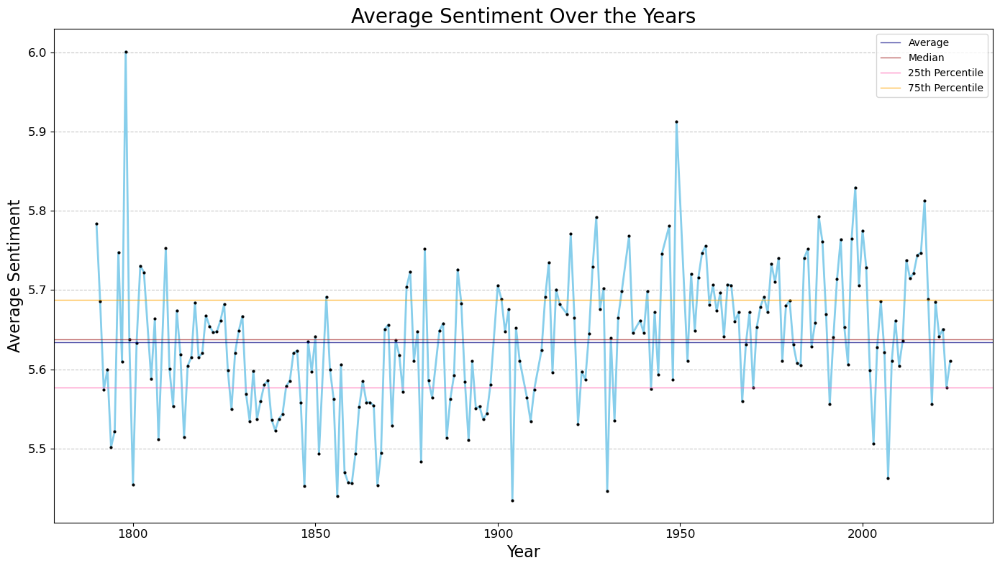

In [292]:
# plot sentiment over the years
# Calculate the median, mean, 25th and 75th percentiles of the sentiment
median_sentiment_years = np.median(list(average_sentiment_over_years.values()))
percentile_25_years = np.percentile(list(average_sentiment_over_years.values()), 25)
percentile_75_years = np.percentile(list(average_sentiment_over_years.values()), 75)
average_sentiment_years = np.mean(list(average_sentiment_over_years.values()))
# Plot the average sentiment over the years with mean, median and 25th and 75th percentiles
plt.figure(figsize=(14, 8))
plt.plot(list(average_sentiment_over_years.keys()), list(average_sentiment_over_years.values()), color='skyblue', marker='o', linestyle='-', linewidth=2, markersize=2, markerfacecolor='black', markeredgecolor='black')
plt.axhline(average_sentiment_years, color='navy', linestyle='-', linewidth=1, label='Average', alpha=0.7)
plt.axhline(median_sentiment_years, color='brown', linestyle='-', linewidth=1, label='Median', alpha=0.7)
plt.axhline(percentile_25_years, color='hotpink', linestyle='-', linewidth=1, label='25th Percentile', alpha=0.7)
plt.axhline(percentile_75_years, color='orange', linestyle='-', linewidth=1, label='75th Percentile', alpha=0.7)
plt.legend()
plt.title('Average Sentiment Over the Years', fontsize=20)
plt.xlabel('Year', fontsize=16)
plt.ylabel('Average Sentiment', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

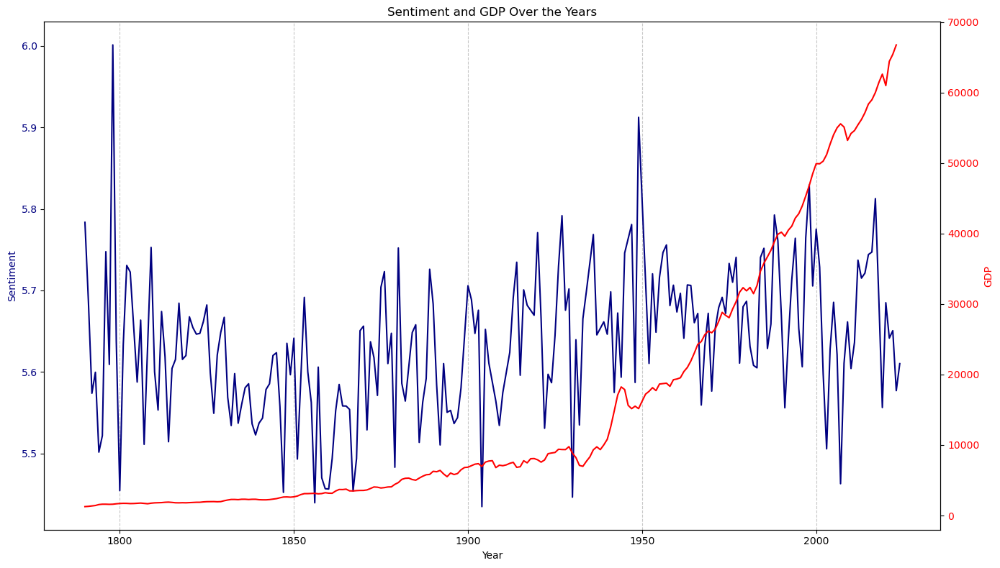

In [293]:
fig, ax1 = plt.subplots(figsize=(14, 8))

ax1.plot(list(average_sentiment_over_years.keys()), list(average_sentiment_over_years.values()), color='navy', label='Sentiment')
ax1.set_xlabel('Year')
ax1.set_ylabel('Sentiment', color='navy')
ax1.tick_params(axis='y', labelcolor='navy')
plt.grid(axis='x', linestyle='--', alpha=0.7)

ax2 = ax1.twinx()
ax2.plot(gdp_data['Year'], gdp_data['Real GDP per capita (dollars)'] , color='red', label='GDP', linestyle='-')
ax2.set_ylabel('GDP', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Sentiment and GDP Over the Years')
plt.tight_layout()
plt.show()


In [298]:
lagged_gdp_values = gdp_data['Real GDP per capita (dollars)'][:-1].values  # Use GDP of the previous year
# the years are not the same so assign none to sentiment of the years with gdp without sentiment
for year in gdp_data['Year']:
    if year not in average_sentiment_over_years.keys():
        average_sentiment_over_years[year] = None

# Convert sentiment_over_years to a list of values and slice it
sentiment_values_lagged = list(average_sentiment_over_years.values())
sentiment_values_lagged = [sentiment for year, sentiment in sorted(zip(average_sentiment_over_years.keys(), sentiment_values_lagged))][1:][:-1]
# Calculate the correlation using pandas .corr method
lagged_df = pd.DataFrame({'Sentiment': sentiment_values_lagged, 'GDP': lagged_gdp_values})
correlation_lagged_pandas = lagged_df['GDP'].corr(lagged_df['Sentiment'])
print(f"Correlation with lagged GDP using pandas .corr: {correlation_lagged_pandas}")

Correlation with lagged GDP using pandas .corr: 0.2973050376311797


In [46]:
# TODO
# find more data to correlate with sentiment